In [ ]:
import numpy as np
import cv2
import pandas as pd
from tensorflow.keras.models import Sequential # type: ignore
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout # type: ignore
from tensorflow.keras.preprocessing.image import ImageDataGenerator # type: ignore
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import train_test_split


In [2]:
def data(dataset_path):
    images = []
    labels = []
    print(f"Dataset Path: {dataset_path}")

    # Iterate through folders (classes) in the dataset directory
    for folder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, folder)

        # Skip if it's not a directory
        if not os.path.isdir(subfolder_path):
            print(f"Skipping non-directory: {subfolder_path}")
            continue

        # Iterate through subfolders (each class's images)
        for subfolder in os.listdir(subfolder_path):
            subfolder_path1 = os.path.join(subfolder_path, subfolder)

            # Skip if it's not a directory
            if not os.path.isdir(subfolder_path1):
                print(f"Skipping non-directory: {subfolder_path1}")
                continue

            # Iterate through each image in the subfolder
            for image_filename in os.listdir(subfolder_path1):
                if image_filename.endswith(".jpg"):  # Use .jpg images only
                    image_path = os.path.join(subfolder_path1, image_filename)
                    images.append(image_path)
                    labels.append(subfolder)  # Use the subfolder name as the label

    # Create a DataFrame to store image paths and corresponding labels
    df = pd.DataFrame({'image': images, 'label': labels})
    print(f"Total images: {len(images)}")
    return df

In [3]:
import os

dataset_path = r"D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration"

# Check if the path exists
print("Path exists:", os.path.exists(dataset_path))

# List the contents of the directory
if os.path.exists(dataset_path):
    print("Contents of dataset path:", os.listdir(dataset_path))


Path exists: True
Contents of dataset path: ['.DS_Store', 'Test', 'Train']


In [4]:
# Display the first few rows of the DataFrame
train = data(dataset_path)
print(train.head())

Dataset Path: D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration
Skipping non-directory: D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration\.DS_Store
Total images: 2357
                                               image              label
0  D:\capstone project\capstone project\Skin canc...  actinic keratosis
1  D:\capstone project\capstone project\Skin canc...  actinic keratosis
2  D:\capstone project\capstone project\Skin canc...  actinic keratosis
3  D:\capstone project\capstone project\Skin canc...  actinic keratosis
4  D:\capstone project\capstone project\Skin canc...  actinic keratosis


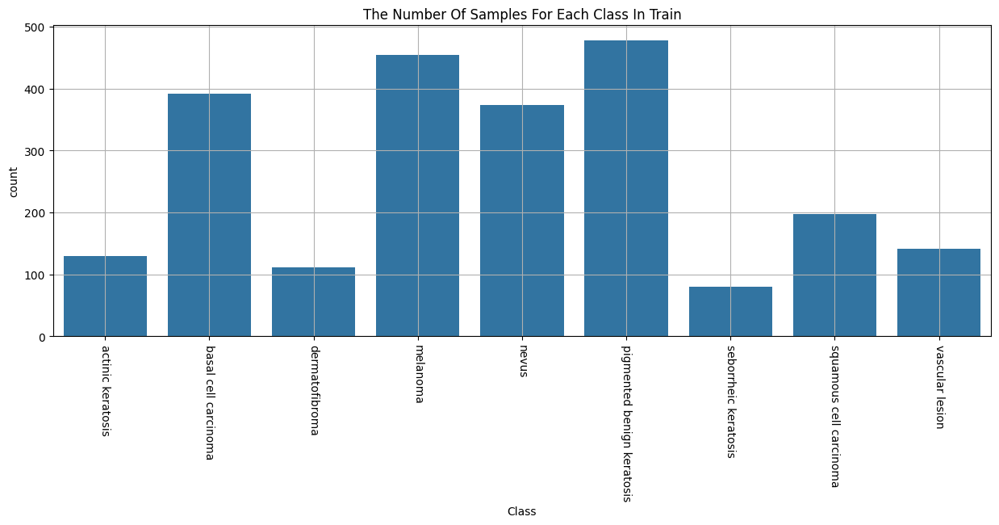

In [5]:
# Visualize class distribution
plt.figure(figsize=(15, 5))
ax = sns.countplot(x=train.label)

# Customize the plot
ax.set_xlabel("Class")
plt.title("The Number Of Samples For Each Class In Train")
plt.grid(True)
plt.xticks(rotation=-90)
plt.show()

In [6]:
print(len(train))

2357


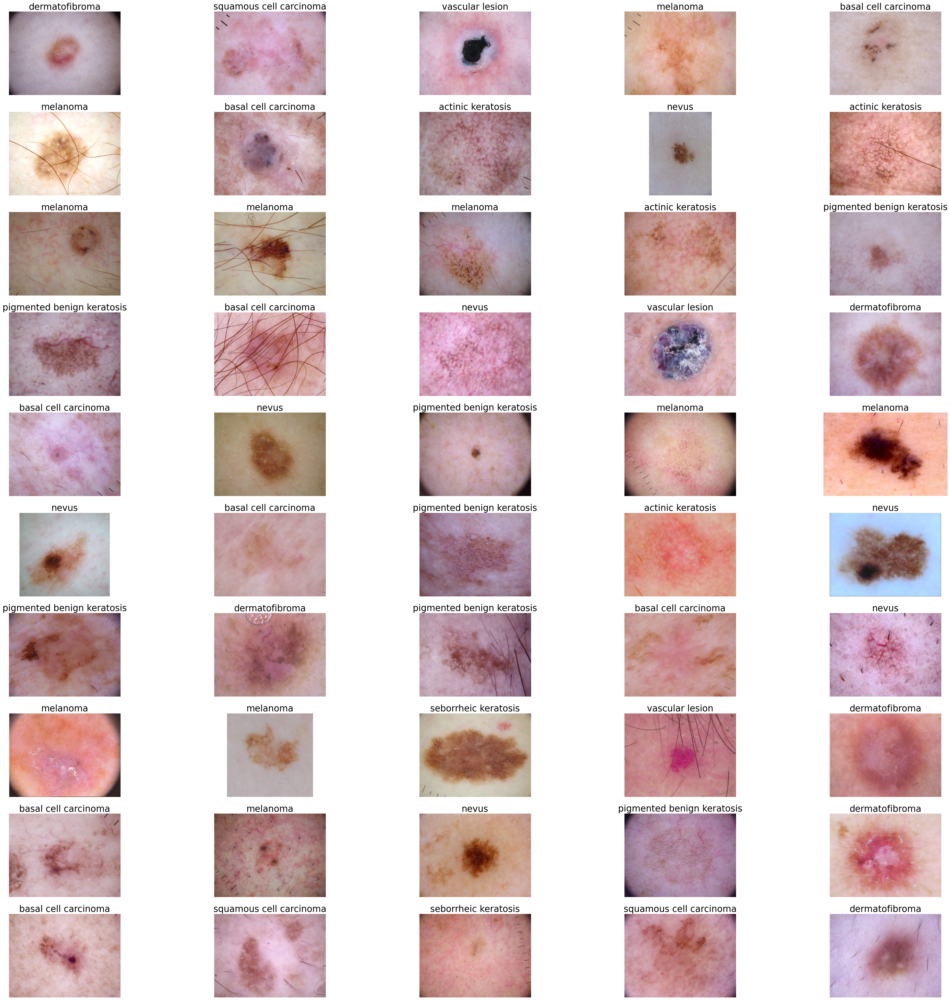

In [7]:
plt.figure(figsize=(50, 50))
for n, i in enumerate(np.random.randint(0, len(train), 50)):  # Randomly pick 50 images
    plt.subplot(10, 5, n + 1)
    img = cv2.imread(train.image[i])  # Read the image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    plt.imshow(img)  # Display the image
    plt.axis('off')  # Remove axis
    plt.title(train.label[i], fontsize=25)  # Set title as the label of the image
plt.show()


In [8]:
df_train, df_test = train_test_split(train, test_size=0.2, stratify=train.label, shuffle=True, random_state=41)

# Display the shape of the train and test sets
print(f'Train set shape: {df_train.shape}')
print(f'Test set shape: {df_test.shape}')

Train set shape: (1885, 2)
Test set shape: (472, 2)


In [9]:
# Define data augmentation techniques for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,           # Normalize pixel values between 0 and 1
    shear_range=0.2,          # Random shear
    zoom_range=0.2,           # Random zoom
    horizontal_flip=True,      # Randomly flip images horizontally
    validation_split=0.2       # Use 20% of the data for validation
)

# Define a generator for validation data (only rescaling)
val_datagen = ImageDataGenerator(
    rescale=1./255,           # Only normalize pixel values for validation
    validation_split=0.2
)

# Replace 'dataset_path' with the actual path to your dataset
dataset_path = r"D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration"  # Example: '/kaggle/input/skin-cancer-dataset/'

# Load and preprocess training and validation data
train_data = train_datagen.flow_from_directory(
    dataset_path,              # Use the correct dataset path
    target_size=(150, 150),     # Resize all images to (150, 150)
    batch_size=32,              # Number of images in each batch
    class_mode='binary',        # Binary classification (disease or no disease)
    subset='training'           # Training data subset (80%)
)

val_data = val_datagen.flow_from_directory(
    dataset_path,              # Use the correct dataset path
    target_size=(150, 150),     # Resize all images to (150, 150)
    batch_size=32,              # Number of images in each batch
    class_mode='binary',        # Binary classification (disease or no disease)
    subset='validation'         # Validation data subset (20%)
)


Found 1887 images belonging to 2 classes.
Found 470 images belonging to 2 classes.


In [10]:
# Build the CNN model
model = Sequential()

# First convolutional layer
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Second convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Third convolutional layer
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten and fully connected layers
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))  # Add dropout to prevent overfitting
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


d:\capstone project\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,828,481 (18.42 MB)

 Trainable params: 4,828,481 (18.42 MB)

 Non-trainable params: 0 (0.00 B)

d:\capstone project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 104s 2s/step - accuracy: 0.8796 - loss: 0.2737 - val_accuracy: 0.9487 - val_loss: 0.2064
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9688 - loss: 0.1315 - val_accuracy: 1.0000 - val_loss: 0.0421
Epoch 3/10


C:\Users\GOOD\AppData\Local\Programs\Python\Python312\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


58/58 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 0.9488 - loss: 0.2198 - val_accuracy: 0.9509 - val_loss: 0.2111
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9375 - loss: 0.2430 - val_accuracy: 0.9545 - val_loss: 0.2140
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.9472 - loss: 0.2113 - val_accuracy: 0.9509 - val_loss: 0.2031
Epoch 6/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7500 - loss: 0.8083 - val_accuracy: 0.9545 - val_loss: 0.1772
Epoch 7/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 0.9516 - loss: 0.1891 - val_accuracy: 0.9487 - val_loss: 0.2079
Epoch 8/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9062 - loss: 0.3657 - val_accuracy: 1.0000 - val_loss: 0.0322
Epoch 9/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 104s 2s/step - accuracy: 0.9576 - loss: 0.1873 - val_accuracy: 0.9509 - val_loss: 0.1974
Epoch 10/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 1.0000 - loss: 0.0810 - val_accuracy: 0.9545 - val_loss: 0.1918


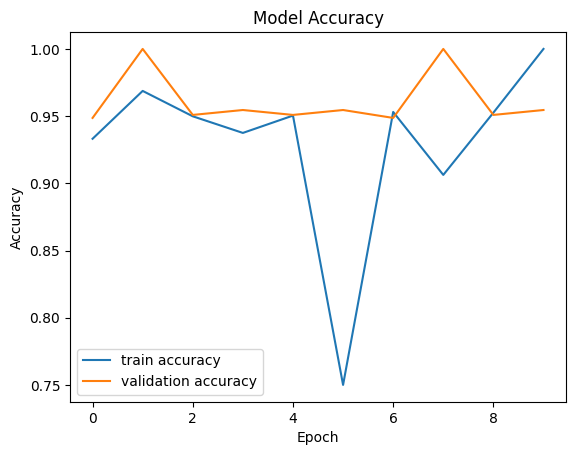

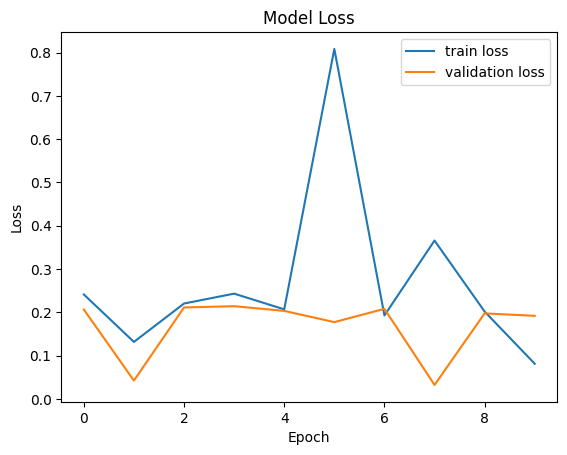

In [11]:
# Train the model
history = model.fit(
    train_data,
    epochs=10,                  # Number of epochs for training
    validation_data=val_data,    # Use validation data for validation during training
    steps_per_epoch=train_data.samples // train_data.batch_size,
    validation_steps=val_data.samples // val_data.batch_size
)

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [14]:
# Define the disease classes
disease_classes = [
    'actinic keratosis',
    'basal cell carcinoma',
    'dermatofibroma',
    'melanoma',
    'nevus',
    'pigmented benign keratosis',
    'seborrheic keratosis',
    'squamous cell carcinoma',
    'vascular lesion'
]

# Function to classify a single image
def classify_image(image_path):
    # Load and preprocess the image
    img = cv2.imread(image_path)

    if img is None:
        print(f"Error: Image not found at {image_path}")
        return None

    img = cv2.resize(img, (150, 150))  # Resize to match model input
    img = img / 255.0  # Normalize pixel values
    img = np.expand_dims(img, axis=0)  # Expand dimensions to match model input

    # Make predictions
    predictions = model.predict(img)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class = disease_classes[predicted_class_index]

    # Confidence level of prediction
    confidence = np.max(predictions) * 100  # Convert to percentage

    return predicted_class, confidence

# Example usage
example_image_paths = [
    r"D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration\Train\actinic keratosis\ISIC_0030344.jpg"
]

# Classify images and print results
for image_path in example_image_paths:
    predicted_disease, confidence = classify_image(image_path)
    if predicted_disease:
        print(f"The predicted disease for {image_path} is: {predicted_disease} (Confidence: {confidence:.2f}%)")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
The predicted disease for D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration\Train\actinic keratosis\ISIC_0030344.jpg is: actinic keratosis (Confidence: 93.98%)


In [15]:
def calculate_disease_percentage(image_path):
    # Load image
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (150, 150))  # Resize to model input size
    image_resized = image_resized / 255.0  # Normalize

    # Predict whether the image contains disease or not
    image_input = np.expand_dims(image_resized, axis=0)
    prediction = model.predict(image_input)

    if prediction > 0.5:  # Disease present
        # Convert to grayscale and threshold the image
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        _, thresholded_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY_INV)

        # Calculate percentage of disease-affected area
        total_pixels = image.shape[0] * image.shape[1]
        disease_pixels = np.sum(thresholded_image == 255)
        disease_percentage = (disease_pixels / total_pixels) * 100

        print(f"Disease detected! Affected area: {disease_percentage:.2f}%")

        # Show original and thresholded images
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.subplot(1, 2, 2)
        plt.imshow(thresholded_image, cmap='gray')
        plt.title("Thresholded Image")
        plt.show()
    else:
        print("No disease detected.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Disease detected! Affected area: 3.70%


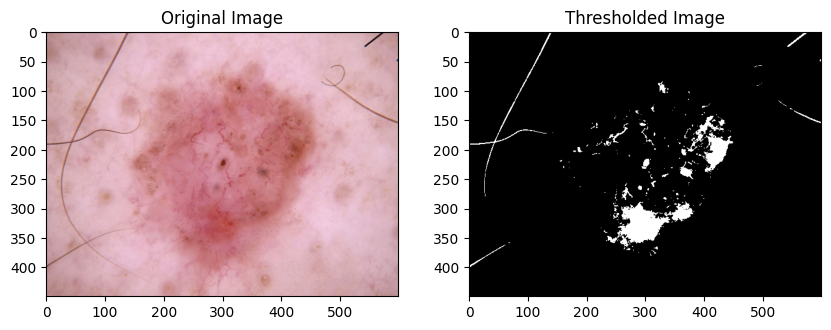

In [17]:
# Test the model on a new image
image_path = r"D:\capstone project\capstone project\Skin cancer ISIC The International Skin Imaging Collaboration\Test\basal cell carcinoma\ISIC_0024332.jpg"  # Replace with your test image path
calculate_disease_percentage(image_path)


In [18]:
model.save("cnn_modelskin.h5")